# What is this doing


Takes the QC file I created from the raw Single Cell data and proccesses it in to clusters and subclusters.

## Setup

### Imports

In [1]:
import numpy as np
import scanpy as sc
import os
import pandas as pd
import bbknn

### Single Cell settings

In [2]:
sc.settings.verbosity = 4
sc.settings.set_figure_params(80) 
sc.settings.file_format_figures = 'png'
sc.settings.savefigs = False
use_first_n_samples = 0
full_sparse = False

C:\Users\TzachiHNB2\AppData\Local\Temp\ipykernel_17168\738880785.py:2: FutureWarning: The specified parameters ('scanpy',) are no longer positional. Please specify them like `scanpy=80`
  sc.settings.set_figure_params(80)


### Defining a function for processing the data & determing the parameters

In [3]:
def processing_batch(adata, neighbors=15, key='batch', reso=0.4, random_state=0):  # Higher resolution yields more leiden clusters 
    sc.pp.scale(adata, max_value=10)
    sc.tl.pca(adata, svd_solver='arpack')
    sc.logging.print_memory_usage()
    sc.pp.neighbors(adata, n_neighbors=neighbors)
    sc.pl.pca_variance_ratio(adata, log=True)
    bbknn.bbknn(adata, batch_key=key, neighbors_within_batch=2, metric='euclidean', n_pcs=30, trim=None)
    sc.tl.umap(adata)
    sc.tl.leiden(adata, resolution=reso)
    sc.pl.umap(adata, color='leiden')

### Reading the excisting h5ad file I created previously in the QC pipeline 

In [4]:
#adata after QC
adata = sc.read(r'/Code/data/single_cell/animals/chicken/ca1/old_genome/''chicken_a1_after_qc.h5ad') 

sc.read_h5ad(r'/Code/data/single_cell/animals/chicken/ca1/old_genome/''chicken_a1_after_qc.h5ad')

# If the anndata object is processed and contains the raw data in adata.raw run -  adata = adata.raw.to_adata()

AnnData object with n_obs × n_vars = 17312 × 14761
    obs: 'treatment', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_MT', 'pct_counts_MT', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'n_cells', 'MT', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'treatment_colors'

## Preprocessing the data 

In [5]:
adata

AnnData object with n_obs × n_vars = 17312 × 14761
    obs: 'treatment', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_MT', 'pct_counts_MT', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'n_cells', 'MT', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'treatment_colors'

In [6]:
adata.obs

,treatment,n_genes,n_genes_by_counts,total_counts,total_counts_MT,pct_counts_MT,S_score,G2M_score,phase
AAACCCACACACAGAG-1-control,control,470,470,701.0,40.0,5.706134,-0.143958,-0.039330,G1
AAACCCACAGCATCTA-1-control,control,379,379,586.0,7.0,1.194539,-0.102633,0.070475,G2M
AAACCCAGTCGAAGCA-1-control,control,484,484,815.0,11.0,1.349693,-0.071776,-0.004156,G1
AAACCCAGTTCGGTTA-1-control,control,677,677,1163.0,39.0,3.353396,-0.006908,-0.069883,G1
AAACCCATCTGTGCAA-1-control,control,533,533,876.0,16.0,1.826484,-0.087657,-0.107246,G1
...,...,...,...,...,...,...,...,...,...
TTTGTTGCAGCTGTAT-1-pic,pic,824,824,1581.0,126.0,7.969639,0.176309,0.407182,G2M
TTTGTTGCATAGAAAC-1-pic,pic,331,331,662.0,0.0,0.000000,-0.030341,-0.011802,G1
TTTGTTGGTCGGCACT-1-pic,pic,528,528,1246.0,20.0,1.605137,-0.069932,0.016117,G2M
TTTGTTGGTCGTTTCC-1-pic,pic,288,287,549.0,1.0,0.182149,0.135133,-0.042805,S


In [7]:
adata.var

,gene_ids,n_cells,MT,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
ENSGALG00000053455,ENSGALG00000053455,7,False,7,0.000364,99.963580,7.0
CLEC2B_1,ENSGALG00000045540,2309,False,2309,0.134651,87.986472,2588.0
CLEC2B_2,ENSGALG00000051297,1626,False,1626,0.093392,91.540062,1795.0
CLEC2B_3,ENSGALG00000042023,6008,False,6008,0.413632,68.740895,7950.0
DHRS2,ENSGALG00000029624,94,False,94,0.005411,99.510926,104.0
...,...,...,...,...,...,...,...
ENSGALG00000050667,ENSGALG00000050667,24,False,24,0.001405,99.875130,27.0
ENSGALG00000054249,ENSGALG00000054249,20,False,20,0.001041,99.895942,20.0
ENSGALG00000047001,ENSGALG00000047001,4,False,4,0.000208,99.979188,4.0
ENSGALG00000048503,ENSGALG00000048503,67,False,67,0.003538,99.651405,68.0


normalizing counts per cell


    finished (0:00:00)
extracting highly variable genes
    Gene indices [ 7572  8746 14531 14533] fell into a single bin: their normalized dispersion was set to 1.
    Decreasing `n_bins` will likely avoid this effect.
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


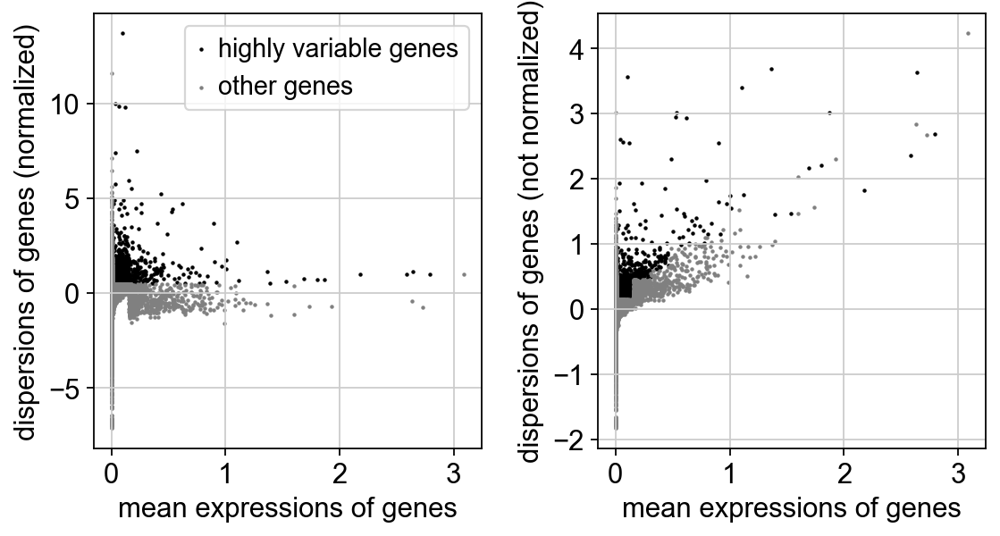

In [8]:
# Cleaning, normalizing, reducing dimensionality, clustering cells and creating visualizations.

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)
adata.raw = adata
# adata = adata[:, adata.var.highly_variable] # For filtering non Highly variable genes. We usually keep all the genes. 

In [9]:
sc.pp.regress_out(adata, ['total_counts','pct_counts_MT'])

# Got it from: https://github.com/theislab/single-cell-tutorial/issues/35
sc.pp.scale(adata, max_value=10)
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.umap(adata) 

regressing out ['total_counts', 'pct_counts_MT']
    sparse input is densified and may lead to high memory use
    finished (0:03:30)
    ... clipping at max_value 10
computing PCA
    with n_comps=50


c:\Python\Python310\lib\site-packages\scanpy\preprocessing\_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    finished (0:00:15)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:35)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:37)
computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


    ... clipping at max_value 10
computing PCA
    with n_comps=50
    finished (0:00:16)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
Memory usage: current 2.86 GB, difference +2.86 GB
computing neighbors
        initialized `.distances` `.connectivities` 
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:02)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


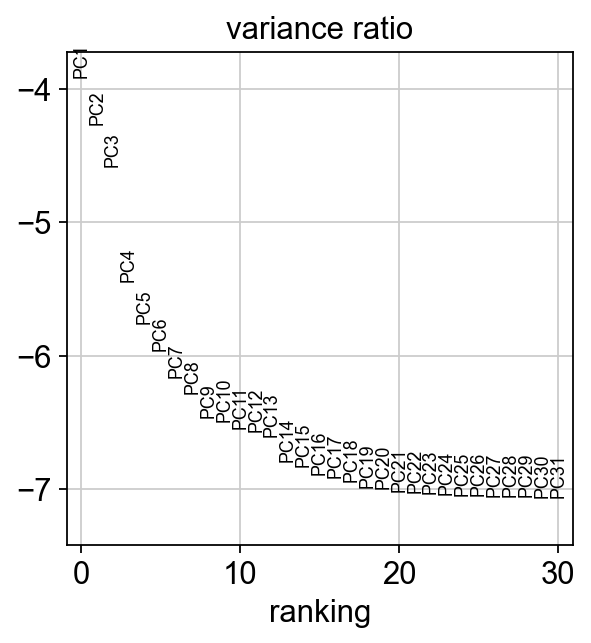

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)
running Leiden clustering


C:\Users\TzachiHNB2\AppData\Local\Temp\ipykernel_17168\2800874316.py:9: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=reso)


    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


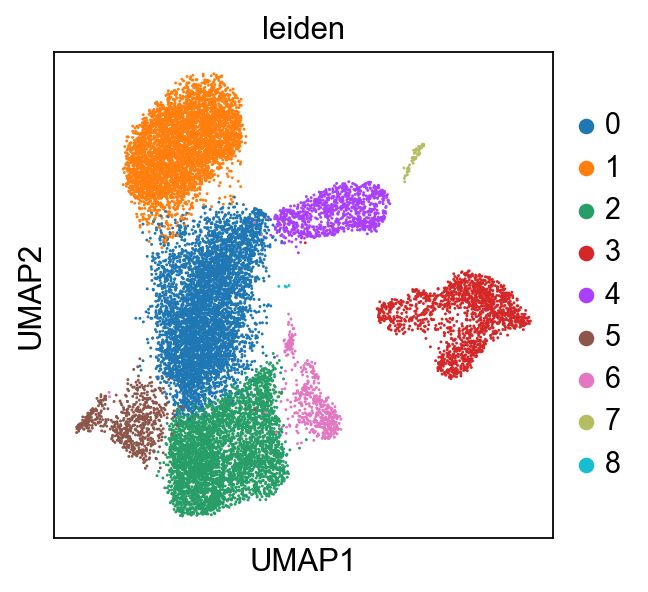

In [10]:
processing_batch(adata, key='treatment')

ranking genes
    consider 'treatment' groups:
    with sizes: [3691 3149 3600 6872]
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:28)


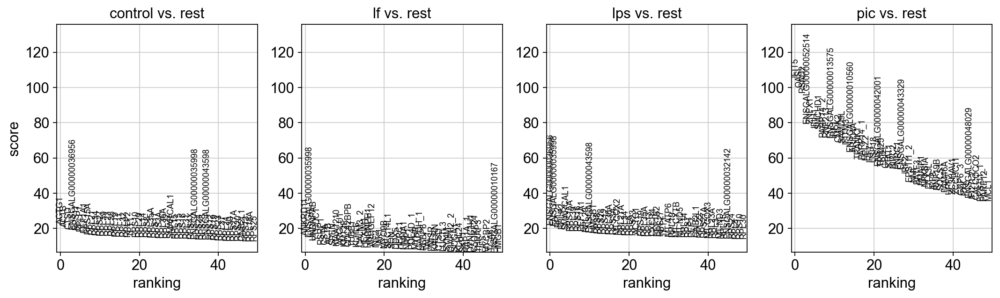

,control,lf,lps,pic
0,ACTG1,ANKRD11,ENSGALG00000036956,IFIT5
1,ACTB,ENSGALG00000035998,ENSGALG00000035998,OASL
2,CTSD,HNRNPAB,RPL21,RSAD2
3,ENSGALG00000036956,YTHDC1,RPLP2,ENSGALG00000052514
4,RPS11,RSRP1,SMARCAL1,ZNFX1
5,RPLP1,CSTA,RPS15A,IFIH1
6,EEF1A1,ACTB,RPL39,SMCHD1
7,RPS15A,SPEN,RPS16,PARP14_2
8,RPL21,KIAA1210,EEF1A1,RNF213
9,RPL34,ARGLU1,RPL29,ENSGALG00000013575


In [11]:
sc.tl.rank_genes_groups(adata, groupby='treatment', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=50, sharey=True)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

# sc.pl.umap(adata[adata.obs['treatment'] == 'control'], color = ['PLAC8', 'CD83', 'CD74', 'CD79B', 'CD38', 'IL10', 'CD7'], size=50)

In [12]:
adata.obs['treatment'].value_counts()

treatment
pic        6872
control    3691
lps        3600
lf         3149
Name: count, dtype: int64

### UMAP's

Markers test box

In [ ]:
sc.pl.umap(adata, color='CMPK2', size=20)

#### T cells

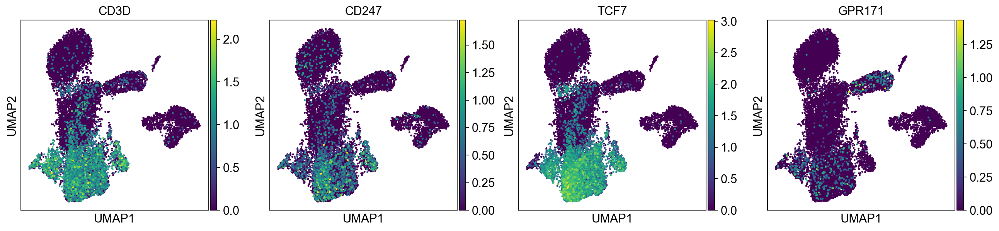

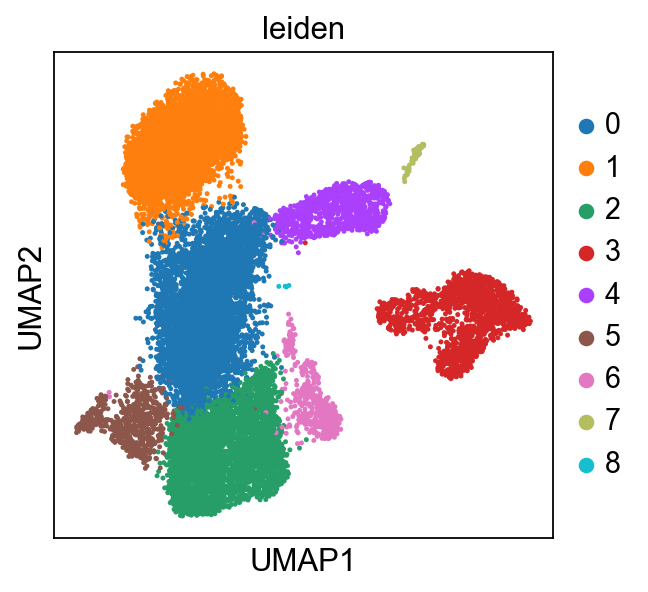

In [13]:
# T cells primarily markers

sc.pl.umap(adata, color=['CD3D','CD247','TCF7','GPR171'], size=20)

sc.pl.umap(adata, color='leiden', size=20)

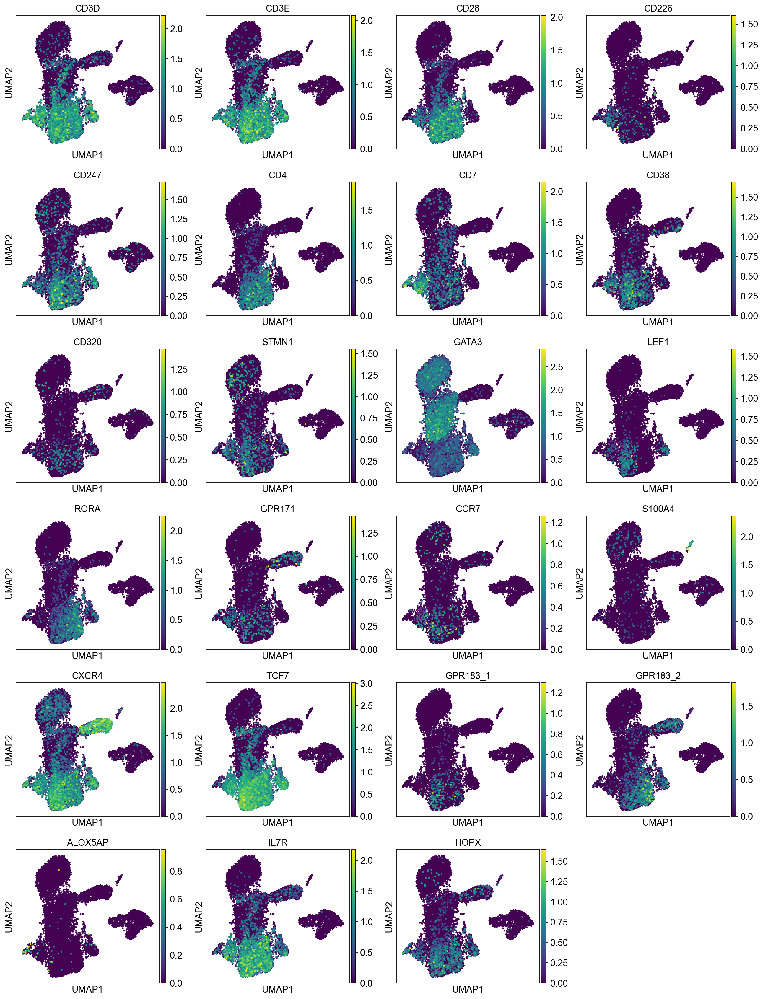

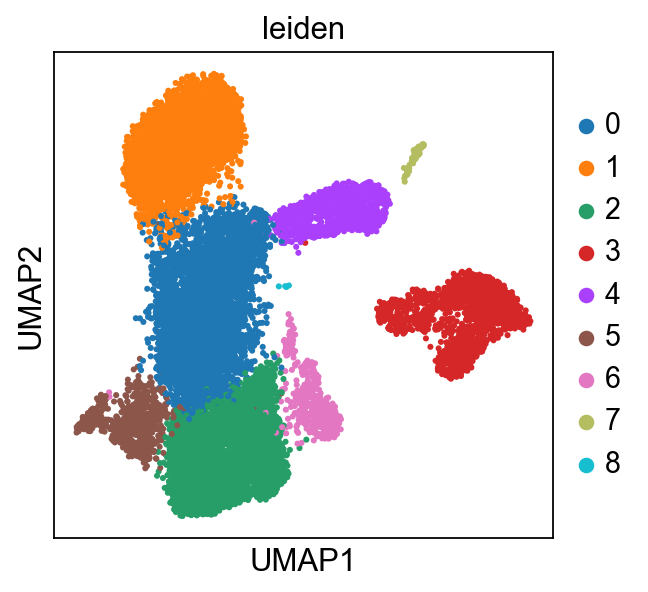

In [14]:
# T cells. 'CCR7' is a marker for T cells and also B cells. Markers from Roy's Extended_Data_Figures.
# Markers for T cells https://www.beckman.com/resources/cell-types/blood-cells/leukocytes/lymphocytes/t-cells
sc.pl.umap(adata, color=['CD3D','CD3E','CD28','CD226','CD247', 
                         'CD4','CD7','CD38','CD320','STMN1','GATA3',
                         'LEF1','RORA','GPR171','CCR7','S100A4','CXCR4',
                         'TCF7','GPR183_1','GPR183_2','ALOX5AP',
                         'IL7R','HOPX'], size=30)

sc.pl.umap(adata, color='leiden', size=30)

In [ ]:
sc.pl.umap(adata[adata.obs['treatment'] == 'control'], color='CD3D', size=20)
sc.pl.dotplot(adata, 'CD3D', groupby='treatment', standard_scale='var')

sc.pl.umap(adata[adata.obs['treatment'] == 'lps'], color='CD3D', size=30)
sc.pl.dotplot(adata, 'CD3D', groupby='treatment', standard_scale='var')

In [ ]:
sc.pl.umap(adata[adata.obs['treatment'] == 'control'], color='IFNAR2', size=20)
sc.pl.dotplot(adata, 'IFNAR2', groupby='treatment', standard_scale='var')

sc.pl.umap(adata[adata.obs['treatment'] == 'pic'], color='IFNAR2', size=30)
sc.pl.dotplot(adata, 'IFNAR2', groupby='treatment', standard_scale='var')

#### B cells

Markers test Box

In [ ]:
sc.pl.umap(adata, color='HLA-DPB1_4', size=30)

In [ ]:
# B cells markers from Roy's data and from https://panglaodb.se/markers.html?cell_type=%27B%20cells%27

sc.pl.umap(adata, color=['CD79B', 'CD38','IRF8','STMN1','TCF4_2',
                         'CCR7','PXK','BANK1','BACH2','CD74',
                         'PLAC8_1','PLAC8_2','IGHE','HLA-DRA',
                         'HLA-DPB1_3','HLA-DPB1_4','HLA-DMA'], size=30) # B_cells. 'JCHAIN'

celltype = {'0':'0','1':'1','2':'T_cells','3':'3','4':'4','5':'T_cells','6':'T_cells','7':'7','8':'8'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

#### RBC

Markers test Box

In [ ]:
# RBC markers from Roy's data and from panglaodb website

sc.pl.umap(adata, color=['STMN1','HBA','HBM','SLC4A1','ANK1'], size=30) 

celltype = {'0':'0','1':'1','2':'T_cells','3':'3','4':'B_cells','5':'T_cells','6':'T_cells','7':'7','8':'8'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

#### Monocytes

In [ ]:
sc.pl.umap(adata, color=['IFIT5','SPI1','CSF1R','S100A4','C1QA','LGALS3',
                         'MAFB','TET2','CD40','TLR4','S100A10','S100A11',
                         'CSTA','CCR2','CCL8_1','CCL8_4','TXN','ACP5','GBP1',
                         'IRF7','PLSCR1','S100A9','RGS1','S100A6',
                         'OASL','RSAD2','ZNFX1','IFIH1','SMCHD1','PARP14_2',
                         'ENSGALG00000013575','CMPK2'], size=30)     #'ENSGALG00000013575'='IFI6'

celltype = {'0':'0','1':'1','2':'T_cells','3':'RBC','4':'B_cells','5':'T_cells','6':'T_cells','7':'7','8':'8'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

#### Platelets

Markers test box

In [ ]:
sc.pl.umap(adata, color='ENSGALG00010019027', size=30)

In [ ]:
# Platelets markers from Roy's data and from https://panglaodb.se/markers.html?cell_type=%27Platelets%27#google_vignette

sc.pl.umap(adata, color=['TUBB1','PLEK','B2M','GP1BA','F13A1',
                         'GNAS','TAGLN2','OAZ1','CD226','PECAM1',
                         'CD36','ITGB3','ENSGALG00000045125'], size=30)     #'ENSGALG00000045125'=GP5

celltype = {'0':'Monocytes','1':'1','2':'T_cells','3':'RBC','4':'B_cells','5':'T_cells','6':'T_cells','7':'Monocytes','8':'Monocytes'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

#### TLR genes in adata by treatment

In [16]:
TLR_genes = ['TLR7', 'TLR5', 'TLR2_1', 'TLR2_2', 'TLR3', 'TLR1', 'TLR21', 'TLR4']

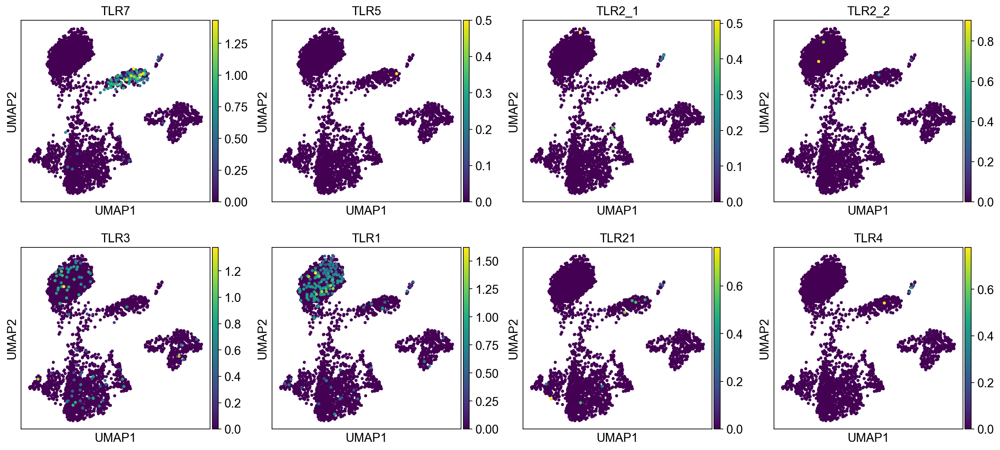

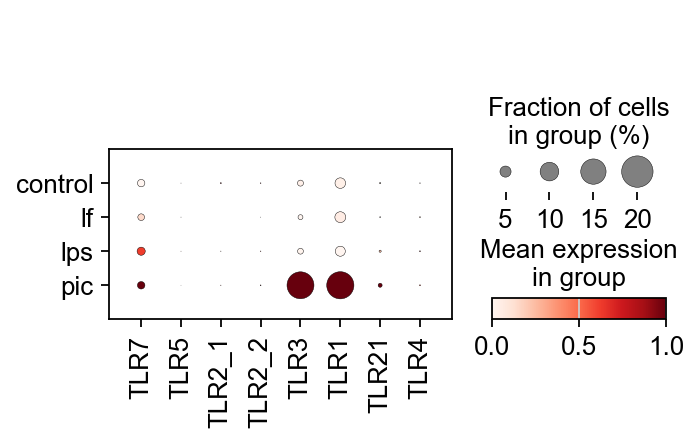

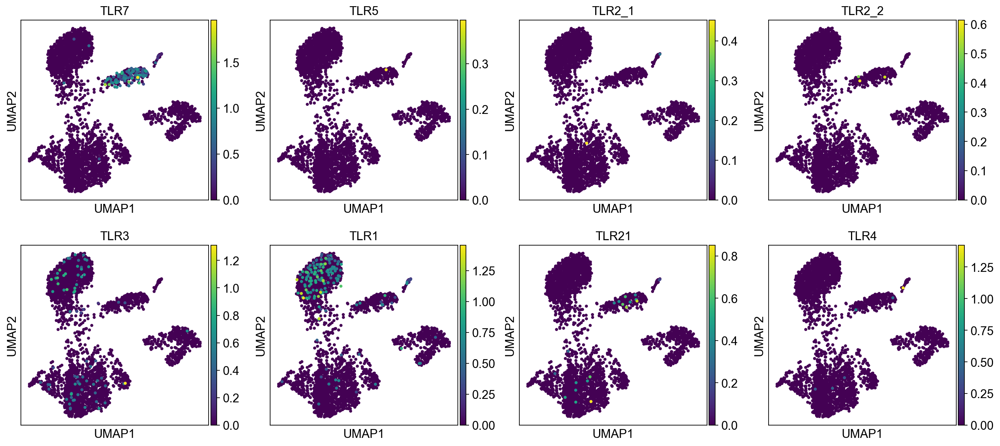

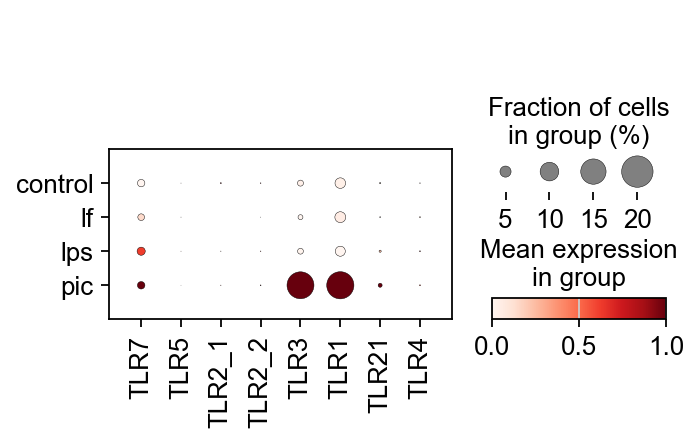

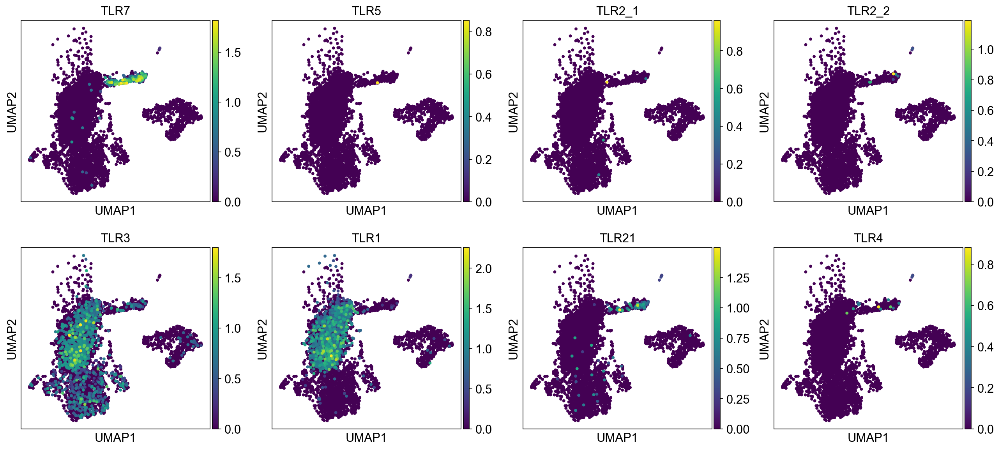

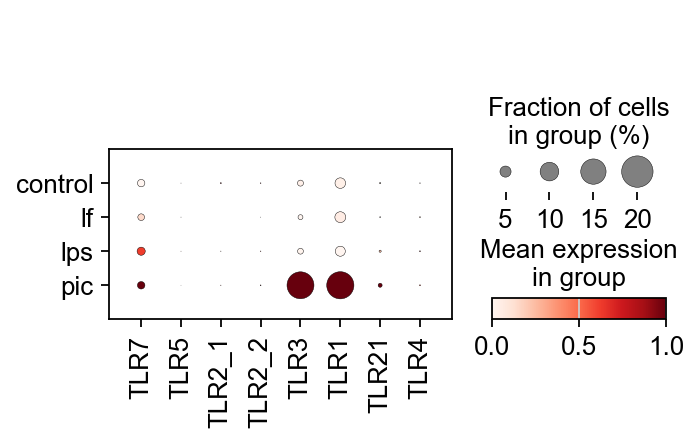

In [17]:
sc.pl.umap(adata[adata.obs['treatment'] == 'control'], color=TLR_genes, size=50)
sc.pl.dotplot(adata, TLR_genes, groupby='treatment', standard_scale='var')

sc.pl.umap(adata[adata.obs['treatment'] == 'lps'], color=TLR_genes, size=50)
sc.pl.dotplot(adata, TLR_genes, groupby='treatment', standard_scale='var')

sc.pl.umap(adata[adata.obs['treatment'] == 'pic'], color=TLR_genes, size=50)
sc.pl.dotplot(adata, TLR_genes, groupby='treatment', standard_scale='var')

#### All clusters

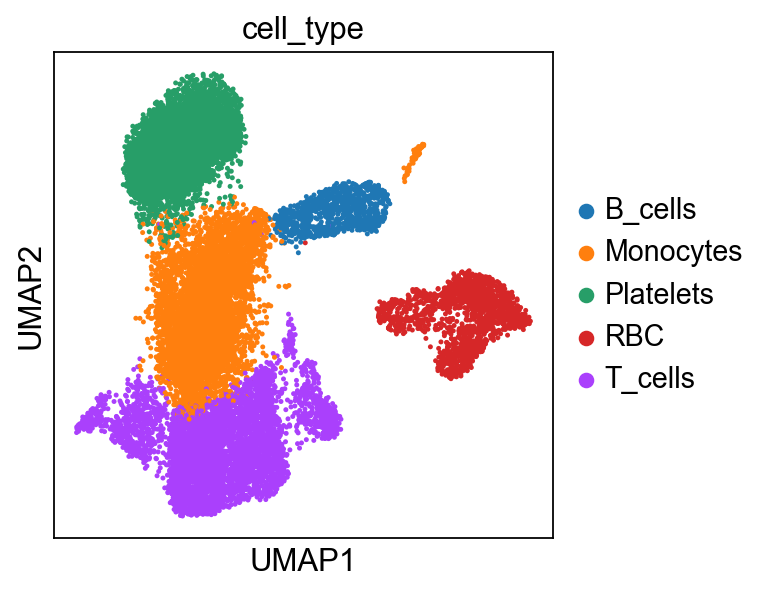

In [14]:
celltype = {'0':'Monocytes','1':'Platelets','2':'T_cells','3':'RBC','4':'B_cells','5':'T_cells','6':'T_cells','7':'Monocytes','8':'Monocytes'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20, save=True)

In [16]:
adata.obs['cell_type'].value_counts()

cell_type
Monocytes    5327
T_cells      5149
Platelets    4294
RBC          1559
B_cells       983
Name: count, dtype: int64

### ISG genes list

In [130]:
df_isg_genes = pd.read_csv('/Code/data/single_cell/animals/chicken/ca1/old_genome/ISG_genes_ca1_old_genome.csv', index_col=0)
df_isg_genes = df_isg_genes.sort_index()

df_isg_genes

""
names
ADAR
AZI2
B2M
CASP8
CD274
...
USP25
WARS
ZC3HAV1


In [131]:
isg_genes_list = df_isg_genes.index.tolist()
isg_genes_list

['ADAR',
 'AZI2',
 'B2M',
 'CASP8',
 'CD274',
 'CD47',
 'CMPK2',
 'CMTR1',
 'DHX58',
 'DNAJA1',
 'DNAJC13',
 'DTX3L',
 'EHD4',
 'ENSGALG00000010560',
 'ERAP1',
 'FAM46A',
 'FMR1',
 'IFI35',
 'IFIH1',
 'IRF1',
 'IRF7',
 'ISG20L2',
 'MORC3',
 'MX1',
 'MYD88',
 'N4BP1',
 'NLRC5',
 'NMI',
 'NUB1',
 'OASL',
 'PARP12',
 'PARP14_1',
 'PARP14_2',
 'PARP9',
 'PML',
 'PSMB1',
 'RFX5',
 'RICTOR',
 'RNF114',
 'RNF19B',
 'RNF213',
 'RNF31',
 'RSAD2',
 'SAT1',
 'SHISA5',
 'SLC25A28',
 'SOCS1',
 'STAT1',
 'STAT2',
 'TDRD7',
 'TNFSF10',
 'TRAFD1',
 'TRIM25',
 'UBA7_1',
 'UBE2L6',
 'USP18',
 'USP25',
 'WARS',
 'ZC3HAV1',
 'ZCCHC2',
 'ZNFX1']

#### UMAP's of the ISG genes

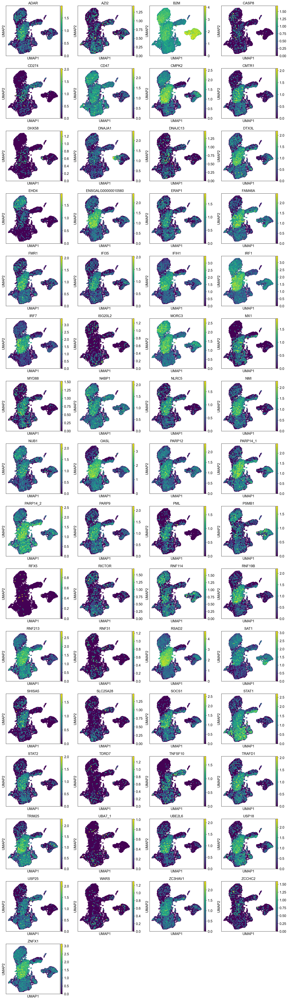

In [132]:
celltype = {'0':'Platelets','1':'T_cells','2':'B_cells','3':'Monocytes','4':'T_cells','5':'RBC','6':'Monocytes'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color=isg_genes_list, size=50)

#### Dotplot of the ISG genes in expressed in turtle

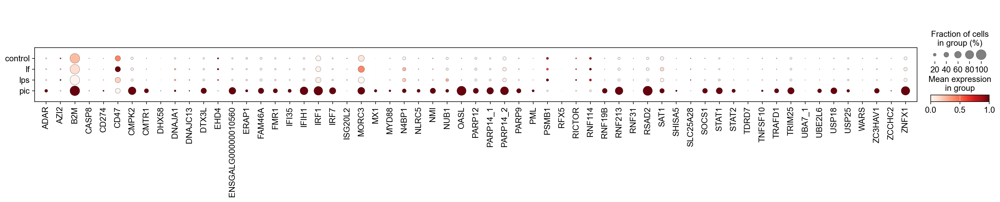

In [133]:
sc.pl.dotplot(adata, isg_genes_list, groupby='treatment', standard_scale='var')

## Gene search tools
This function returns a list of genes that are present in adata (markers for example) from an input of a general list.

In [15]:
def find_gene(gene):
    GENES = list(adata.raw.var.index[adata.raw.var.index.str.startswith(gene.upper())])
    return GENES

find_gene('TLR')

['TLR7', 'TLR5', 'TLR2_1', 'TLR2_2', 'TLR3', 'TLR1', 'TLR21', 'TLR4']

In [ ]:
# adata.var[adata.var_names == 'GZMK']
# adata.var[adata.var['gene_ids'] == 'ENSGALG00000052514']